
---

If you're preparing for an exam, **focus on these key areas**:

* 🎯 Concepts of image manifolds
* 🔄 How autoencoders compress data
* ⚔️ How GANs work (min-max game, generator-discriminator setup)
* 🧠 What problems GANs face
* 🎨 Use-cases of conditional GANs
* 🌫️ How diffusion models differ from GANs and their strengths
* 🗣️ Role of conditioning (text/image prompts) in modern generative models

---


---

## 🧠 1. **Image Manifolds & Representation**

* Images are **high-dimensional data** (e.g. 256x256 RGB = \~200,000 dimensions), but **natural images lie on a low-dimensional manifold**.
* **Image manifold**: The space of valid natural images (structured, smooth regions) within the larger space of all possible images (mostly noise).
* Implication: A good generative model should produce **samples that lie on this manifold**, not in the noisy, invalid image space.
---

## 🔍 What Is an Image Manifold?

### 📌 Basic Idea:

* Think of all possible images (say, 256×256 RGB) as points in a **huge high-dimensional space** — each pixel and color channel is a dimension.
* This space is denoted $\mathbb{R}^{H \times W \times C}$, e.g., $\mathbb{R}^{256 \times 256 \times 3} \approx \mathbb{R}^{200,000}$

But **most of this space is just garbage**: noisy, unstructured images that do not resemble anything meaningful.

### 🎯 Natural images — like photos of cats, humans, trees — form a **tiny structured region** in this vast space.

This region is called the **natural image manifold**.

---

## 🌄 Intuitive Example:

Imagine a **giant sphere** representing all images.
Inside it is a thin, twisty **sheet** — this is the **image manifold**.

* Any point on the sheet → a natural, realistic image.
* Random point outside → unrecognizable noise.

So, generative models aim to **sample from this thin sheet**, not the whole space.

---

## 💡 Why Is This Important?

1. **Generative models** like GANs, VAEs, or diffusion models must **learn to model the manifold**, not the full space.
2. If a model generates an image **off the manifold**, it will look weird or unrealistic.
3. **Interpolation** between images is meaningful **only on the manifold**.

---

## 🧠 Mathematically:

Let:

* $\mathcal{I} \subset \mathbb{R}^{D}$ be the set of all natural images.
* $D$ is the dimension of image space (e.g., 200k).
* $\mathcal{M} \subset \mathcal{I}$ be the **manifold** of natural images.
* The manifold $\mathcal{M}$ has **much lower intrinsic dimension**, e.g., maybe just a few hundred or thousand dimensions.

The **goal of generative models** is to approximate this $\mathcal{M}$ and **sample from it efficiently**.

---

## 🔬 Manifold Learning in Practice

* Traditional **dimensionality reduction** techniques (PCA, t-SNE, Isomap) attempt to model manifolds.
* In deep learning, **autoencoders** compress images into latent vectors that (hopefully) capture this manifold.
* **GANs** or **diffusion models** generate new points on this manifold.

---

## 🧪 Thought Experiment:

Imagine a 100-dimensional latent vector (noise), passed through a **generator network**.
This maps the latent vector onto a point in image space — **hopefully onto the manifold**.

Bad generator → images off the manifold → garbage.
Good generator → manifold-aware → realistic outputs.

---

## 📷 Visual Analogies:

* Think of the **manifold as a smooth mountain trail** in a huge forest.
* You want to **walk only on the trail** (generate valid images).
* If you step off the trail (sample random high-dimensional vectors), you end up lost in noise — unrecognizable images.

---

## 🧭 In Summary:

| Concept                | Meaning                                                                     |
| ---------------------- | --------------------------------------------------------------------------- |
| Image space            | All possible combinations of pixels in an image                             |
| Natural image manifold | Structured subset where real-looking images live                            |
| Why it matters         | Generative models should learn to stay on this manifold                     |
| Goal                   | Learn a function that maps low-dim vectors (latent space) onto the manifold |

---



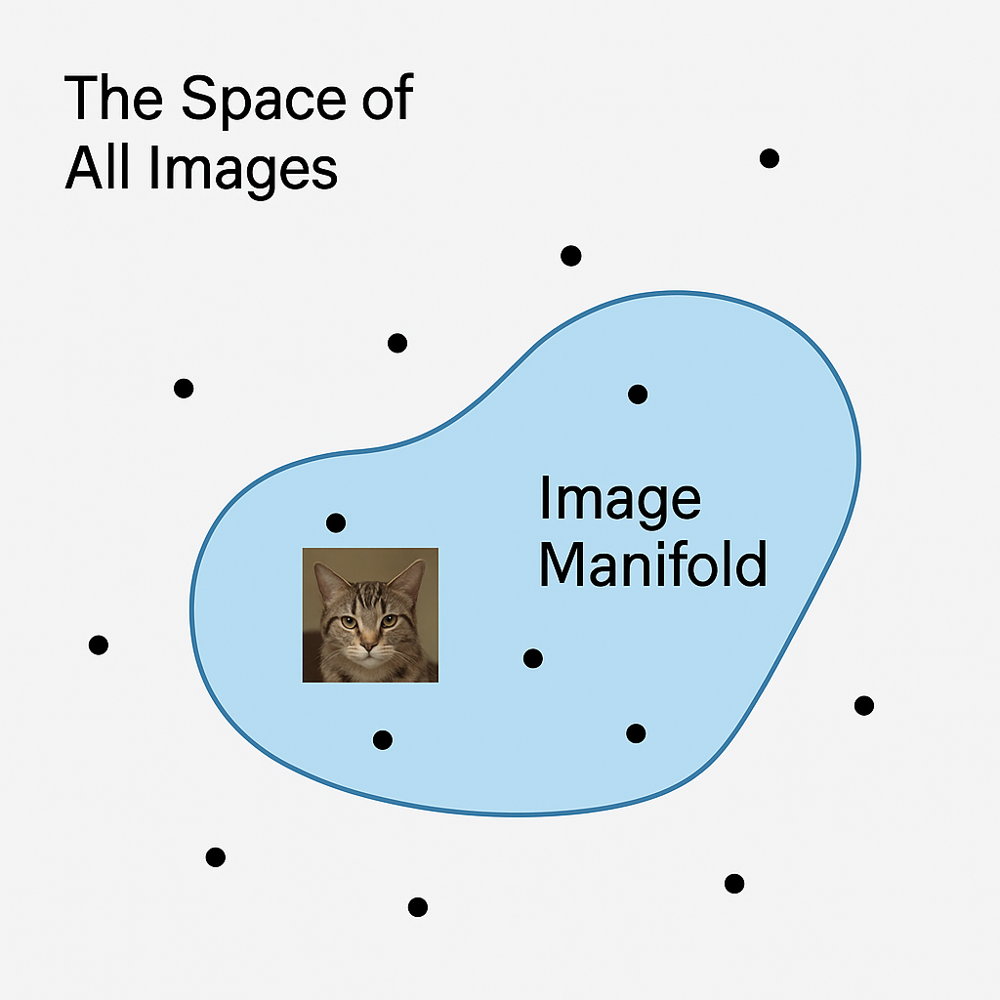

---

## 🧠 2. **Autoencoders**

* Architecture: Encoder → bottleneck (latent vector) → Decoder.
* **Purpose**: Dimensionality reduction, reconstruction, denoising.
* Learns to map images to a **lower-dimensional latent space** and back.
* **Limitation**: Doesn’t generate new, realistic images — just compresses and reconstructs.

---

## 🧠 What is an Autoencoder?

An **autoencoder** is a **neural network architecture** used to **compress data into a low-dimensional space** (encoding) and then **reconstruct it** (decoding). It consists of two main components:

### 🧩 Architecture:

1. **Encoder $f_\theta(x)$**:

   * Maps input $x$ (e.g., an image) to a **latent vector** $z \in \mathbb{R}^d$, with $d \ll D$.
2. **Decoder $g_\phi(z)$**:

   * Maps $z$ back to a reconstruction $\hat{x}$, ideally close to the original $x$.

$$
x \xrightarrow{Encoder} z \xrightarrow{Decoder} \hat{x}
$$

The goal is to **minimize reconstruction loss**:

$$
\mathcal{L}(x, \hat{x}) = \|x - \hat{x}\|^2 \quad \text{or} \quad \text{cross-entropy loss (for binary pixels)}
$$

---

## 🎯 Purpose of Autoencoders

* Learn a **compact, structured representation** of data — a latent space.
* The **latent space** approximates the **manifold of natural images**.
* Acts as a form of **unsupervised learning** — no labels needed.

---

## 📦 Variants of Autoencoders

### 1. **Vanilla Autoencoder**

* Basic encoder-decoder.
* Learns compressed representation.
* Reconstruction quality may vary.
* Can **overfit** to training data.

### 2. **Denoising Autoencoder**

* Trained to reconstruct **clean image $x$** from a **noisy version $\tilde{x}$**.
* Helps model more robust representations.
* Encourages learning of **structure** rather than memorization.

### 3. **Sparse Autoencoder**

* Adds penalty to force latent vector $z$ to be **mostly zeros**.
* Promotes **feature disentanglement**.

### 4. **Variational Autoencoder (VAE)**

* Adds probabilistic interpretation.
* Latent space $z$ is sampled from a distribution (typically Gaussian).
* Optimizes:

  * Reconstruction loss
  * KL divergence (forces latent vectors toward normal distribution)
* Can **generate new samples** by sampling from the latent distribution.

---

## 🧠 Role in Generative Models

While a **vanilla autoencoder** just learns compression, a **VAE** learns a **generative process**:

$$
z \sim \mathcal{N}(0, I) \Rightarrow x = g_\phi(z)
$$

This allows you to **generate novel images** by sampling random latent vectors and decoding them — just like GANs and diffusion models, but more stable.

---

## 🖼️ Visual Analogy

Imagine you have a **complex 3D sculpture** (image data).
An autoencoder:

* **Encoder**: flattens it into a blueprint (latent code)
* **Decoder**: rebuilds the sculpture from the blueprint

If trained well, this blueprint captures the **essential structure** (i.e., the image manifold).

---

## 💬 Practical Use-Cases

| Use Case            | How Autoencoders Help                                  |
| ------------------- | ------------------------------------------------------ |
| Compression         | Reduce image size using learned latent representations |
| Denoising           | Remove noise from corrupted images                     |
| Feature learning    | Use latent vectors as features for other models        |
| Anomaly detection   | High reconstruction error = outlier image              |
| Pretraining         | Initialize weights before supervised learning          |
| Generative modeling | (with VAE) Sample new images                           |

---

## 🧪 Loss Function Details

For a **grayscale image** $x \in \mathbb{R}^{H \times W}$, you can use:

### Mean Squared Error (MSE):

$$
\mathcal{L} = \frac{1}{HW} \sum_{i=1}^{H} \sum_{j=1}^{W} \left(x_{ij} - \hat{x}_{ij}\right)^2
$$

For **binary or normalized pixel values**, use:

### Binary Cross-Entropy:

$$
\mathcal{L} = -\sum_{i} x_i \log(\hat{x}_i) + (1 - x_i) \log(1 - \hat{x}_i)
$$

---

## 📍 Summary

| Term         | Meaning                                            |
| ------------ | -------------------------------------------------- |
| Encoder      | Compresses input to latent code                    |
| Decoder      | Reconstructs input from code                       |
| Latent space | Compact, structured manifold approximation         |
| Goal         | Learn efficient representation of images           |
| Generation   | Possible with VAE (sample from latent space)       |
| Link to GANs | Both try to learn image manifolds, but differently |

---



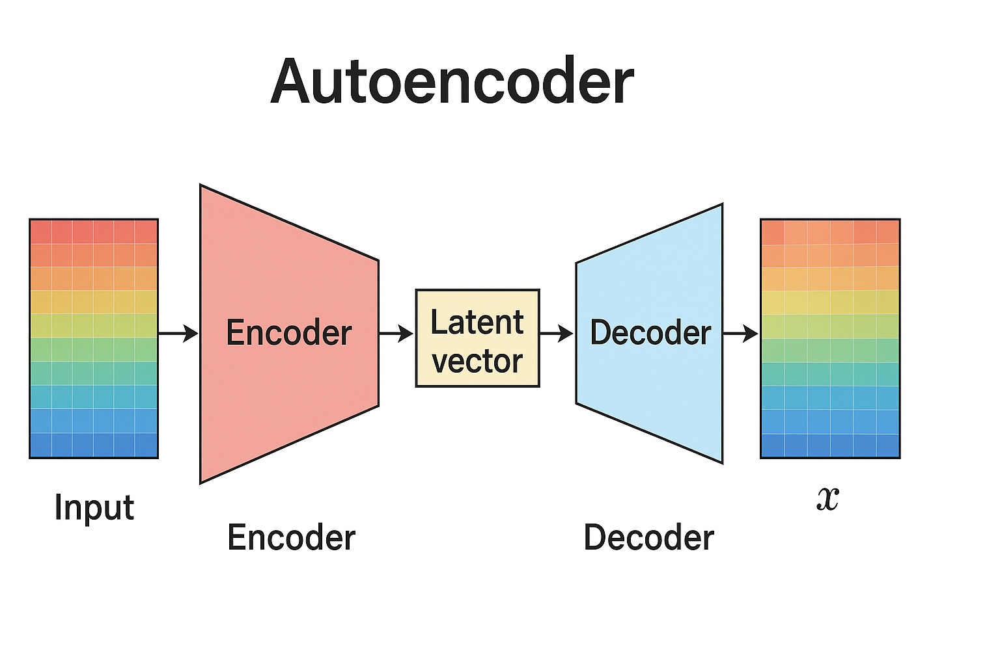

---

## 🧠 3. **Generative Adversarial Networks (GANs)**

### 🤖 Architecture:

* **Generator (G)**: Learns to map random noise to images.
* **Discriminator (D)**: Learns to classify if an image is real or generated.
* Trained in a **min-max game**:
  G tries to **fool D**, and D tries to **not be fooled**.

### 📉 Loss Function:

* G sees D as a **learned loss function**, not handcrafted.
* D is continuously updated, so G must adapt — **no fixed objective**.


---

## ⚔️ What is a GAN?

A **Generative Adversarial Network (GAN)** is composed of two neural networks that **compete in a zero-sum game**:

### 🎭 The Two Players:

| Component             | Purpose                                                                                        |
| --------------------- | ---------------------------------------------------------------------------------------------- |
| **Generator $G$**     | Takes a random noise vector $z$ and tries to generate **realistic-looking fake images**        |
| **Discriminator $D$** | Takes an image and tries to decide if it is **real (from the dataset)** or **fake (from $G$)** |

They are trained **simultaneously**:

* $G$ improves by **fooling $D$**
* $D$ improves by **getting better at catching $G$'s fakes**

---

## 🧠 The Game

### 🎯 Goal of the Generator:

Generate data $G(z)$ that looks like real images.

### 🕵️‍♂️ Goal of the Discriminator:

Correctly classify whether a given image is real or fake.

### 🤝 Minimax Objective:

$$
\min_G \max_D V(D, G) = \mathbb{E}_{x \sim p_{\text{data}}}[\log D(x)] + \mathbb{E}_{z \sim p_z}[\log(1 - D(G(z)))]
$$

* $D(x)$: Probability that image $x$ is real.
* $G(z)$: A fake image generated from noise $z$.

This forms a **two-player game**, where both networks improve against each other over time.

---

## 🎯 Why Use GANs?

Because **they learn the data distribution** implicitly, and:

* Produce **sharp**, high-resolution images.
* Require **no likelihood estimation** (unlike VAEs).
* Can be **conditioned** to control the output (→ see Point 4).

---

## 💣 Training Challenges

1. **Instability**:

   * GANs are notoriously hard to train.
   * If $D$ becomes too good, $G$ gets no useful gradient.

2. **Mode Collapse**:

   * $G$ might start generating the same image over and over, ignoring variety in the dataset.

3. **Non-convergence**:

   * Networks oscillate or diverge instead of converging to a stable distribution.

---

## 🔧 GAN Loss Functions

1. **Original Loss** (as above):

   * Minimizes $\log(1 - D(G(z)))$, which leads to **vanishing gradients** early in training.

2. **Non-saturating Loss** (Goodfellow suggestion):

   * Generator maximizes $\log(D(G(z)))$ instead → stronger gradients.

3. **Wasserstein GAN (WGAN)**:

   * Uses a different distance metric (Earth Mover’s Distance) to stabilize training.

---

## 🌌 Latent Space & Sampling

* Input to $G$: A **low-dimensional vector** $z \sim \mathcal{N}(0, I)$
* The generator **maps this latent space to image space**
* By sampling from $z$, you can create infinite new images on the **image manifold**

You can even **interpolate between two latent codes** to morph one image into another!

---

## 🧪 Example Workflow

1. Sample random vector $z \sim \mathcal{N}(0, I)$
2. Pass through generator: $x_{\text{fake}} = G(z)$
3. Pass both $x_{\text{fake}}$ and real $x_{\text{real}}$ to $D$
4. Train $D$ to tell them apart
5. Train $G$ to **fool $D$** into thinking $x_{\text{fake}}$ is real

---

## 🧠 Summary Table

| Term              | Meaning                                                        |
| ----------------- | -------------------------------------------------------------- |
| Generator $G$     | Learns to synthesize realistic data from noise                 |
| Discriminator $D$ | Learns to detect whether a sample is real or generated         |
| Minimax Game      | $G$ minimizes while $D$ maximizes the adversarial loss         |
| Latent space $z$  | Compact input to the generator that gets mapped to image space |
| Goal              | Make $G(z) \sim p_{\text{data}}$: generated images match real  |

---

## 🖼️ Visual Metaphor

Imagine:

* $G$ is a **counterfeiter** trying to produce fake banknotes.
* $D$ is a **police officer** trying to detect fakes.
* Over time, both get better — until the counterfeits are indistinguishable from real money.

---



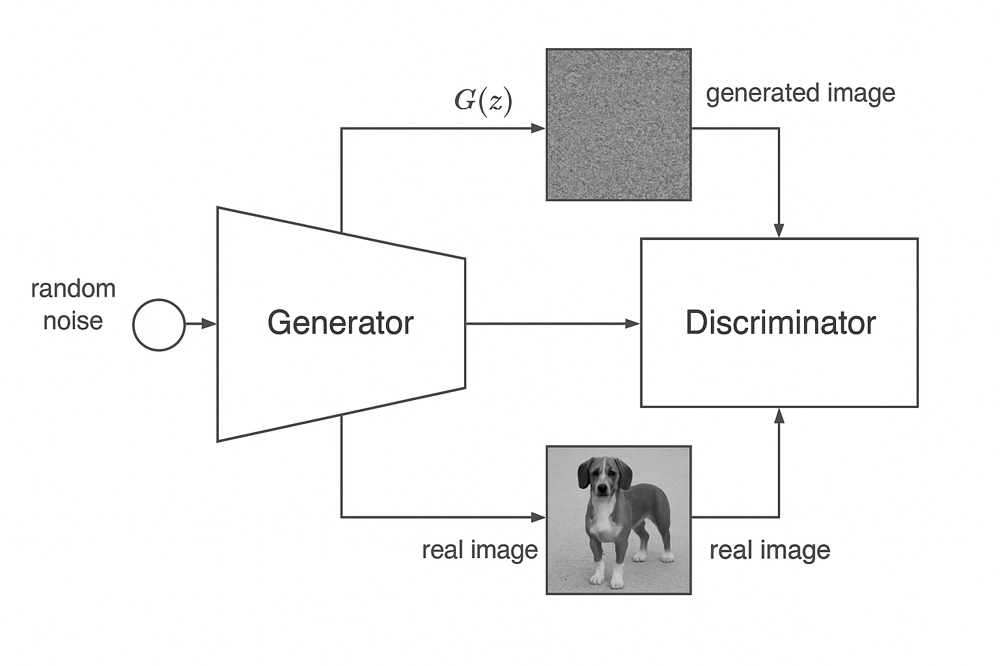

---

## 🧠 4. **Conditional GANs (cGANs)**

### 🎯 Conditioning:

* Instead of generating arbitrary images, **G and D receive extra input (e.g. labels, images)**.
* Allows for **image-to-image translation** and **controlled generation**.

### 🖼️ Examples:

* **BW → Color**
* **Labels → Street View**
* **Edges → Photo**
* **Day → Night**
* **Pose → Person**
* **Image inpainting (fill missing parts)**

### 🌐 Key Papers:

* \[Isola et al., 2017] — Pix2Pix
* \[Goodfellow et al., 2014] — Original GAN paper

---

## 🧠 What are Conditional GANs?

**Conditional GANs (cGANs)** are an extension of GANs where both the **generator and discriminator** are conditioned on some **additional input**.

This additional input can be:

* A **class label** (e.g., “dog” vs. “cat”)
* An **image** (e.g., edge sketch, segmentation mask)
* A **text prompt** (e.g., "a red car on a mountain")
* Any **auxiliary data** that guides the generation process

---

## 🔁 Architectural Difference (Compared to GAN)

| Component    | Classic GAN         | Conditional GAN                     |
| ------------ | ------------------- | ----------------------------------- |
| Input to $G$ | Noise vector $z$    | $z$ + condition $c$                 |
| Input to $D$ | Image               | Image + condition $c$               |
| Output       | Uncontrolled sample | Conditioned sample (e.g., of a dog) |

$$
G(z, c) \rightarrow \text{Generated image matching condition } c \\
D(x, c) \rightarrow \text{Probability that image } x \text{ is real given condition } c
$$

---

## 💡 Why Conditional GANs?

Because **plain GANs are uncontrolled** — you get random samples.
With **conditional GANs**, you can **steer the generator** toward a desired output.

This allows:

* Generating specific **classes of images**
* Doing **image-to-image translation**
* Using **semantic maps, poses, sketches** as guidance

---

## 📸 Real-World Examples

### 🧾 Label → Image

Generate a photo given a label:

* Input: "Horse"
* Output: A realistic horse image

### 🖋 Edges → Photo (Pix2Pix)

Sketch input:

* Input: Edge map of a handbag
* Output: A photorealistic handbag

### 🧍 Pose → Person

* Input: Stick figure pose
* Output: Realistic human in that pose

### ☀️ Day → Night

* Input: Daytime photo
* Output: Same scene at night

### 🌍 Map → Satellite Image

* Input: Google Maps street layout
* Output: Satellite view

---

## 📚 Famous Papers

* **Pix2Pix** (Isola et al., 2017):

  * Uses cGANs for **paired image-to-image translation**.
  * Input: paired dataset (e.g., edge → photo).
* **CycleGAN** (Zhu et al., 2017):

  * Unpaired translation using **cycle consistency** loss.
  * Input: e.g., horses ↔ zebras with no direct pairings.

---

## 🧪 Training Loss

In Pix2Pix (typical cGAN), the objective includes:

1. **Adversarial Loss (cGAN)**:

   $$
   \mathcal{L}_{cGAN}(G, D) = \mathbb{E}_{x, y}[\log D(x, y)] + \mathbb{E}_{x, z}[\log (1 - D(x, G(x, z)))]
   $$

   * Encourages generator to fool the discriminator **given condition** $x$.

2. **L1 Loss (Pixel-wise)**:

   $$
   \mathcal{L}_{L1}(G) = \mathbb{E}_{x, y, z}[\|y - G(x, z)\|_1]
   $$

   * Encourages generated image to be **close to ground truth**.

Combined loss:

$$
\mathcal{L}_{\text{total}} = \mathcal{L}_{cGAN} + \lambda \mathcal{L}_{L1}
$$

---

## 🧭 Summary

| Term            | Meaning                                                               |
| --------------- | --------------------------------------------------------------------- |
| Conditional GAN | GAN where generation is guided by an input (label, image, text, etc.) |
| Generator       | Learns to produce image conditioned on input                          |
| Discriminator   | Learns to distinguish real vs fake **given the same condition**       |
| Benefit         | Allows controlled, targeted image generation                          |
| Famous Uses     | Pix2Pix, CycleGAN, image-to-image translation, text-to-image          |

---



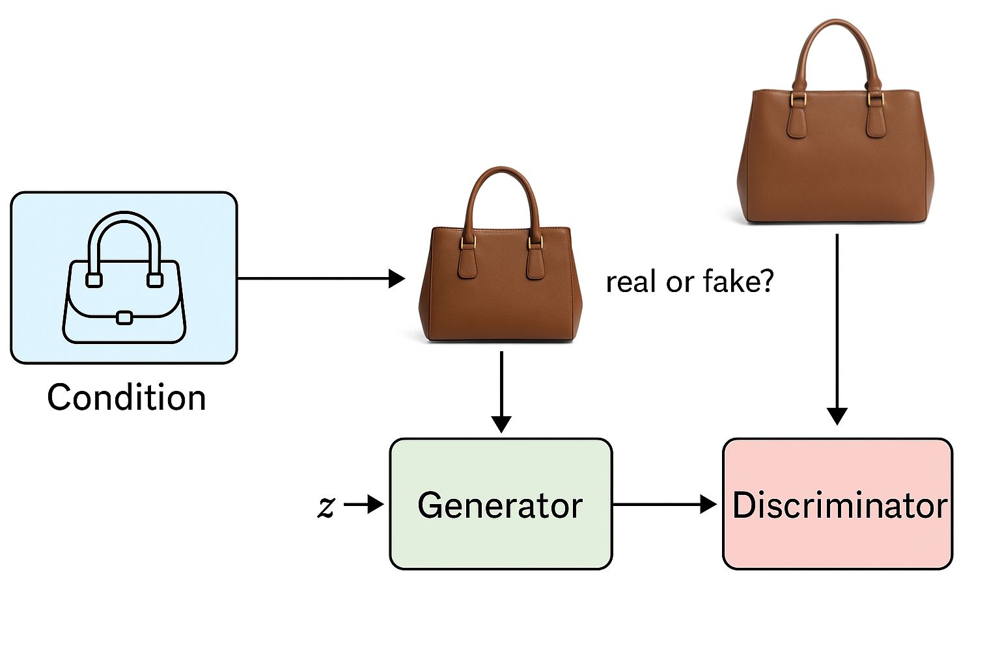

---

## 🧠 5. **Unconditional GANs**

* Goal: Learn the manifold of a single category (e.g. faces, bedrooms).
* Input: just random noise vector $z$ → output image
* Enables **latent space interpolation** and **attribute manipulation**.


---

## 🔓 What Are Unconditional GANs?

In **unconditional GANs**, the **generator receives only random noise** (e.g., $z \sim \mathcal{N}(0, I)$) as input, and generates an image **without any external condition or label**.

This is the **original setup** introduced by Goodfellow et al. in 2014.

### ✨ Goal:

Learn to model the distribution $p_{\text{data}}(x)$ of **real-world images** from a dataset — **without being told what kind of image is expected**.

---

## 🧠 How It Works (Recap)

* **Generator $G(z)$**:
  Learns a function to map latent noise vectors $z \in \mathbb{R}^d$ into **realistic-looking images** $x \in \mathbb{R}^{H \times W \times C}$

* **Discriminator $D(x)$**:
  Learns to distinguish between:

  * Real image $x \sim p_{\text{data}}$
  * Fake image $x = G(z)$

---

## 🌌 What Does It Learn?

Unconditional GANs **implicitly learn the image manifold** of the dataset:

* If you train on **faces**, the GAN learns the **face manifold**.
* If you train on **bedrooms**, it learns how to generate bedroom-like images.
* There is **no label or guidance** — just raw data and adversarial learning.

### 🧭 Latent Space Exploration:

The latent vector $z$ captures **high-level semantic features** like:

* Identity
* Orientation
* Pose
* Style
* Lighting

You can:

* **Interpolate between two $z$ vectors** to morph images
* **Sample new $z$** to create completely new but coherent images

---

## 🔍 Real-World Example Datasets

Some classic datasets used for unconditional GANs:

| Dataset           | Content              |
| ----------------- | -------------------- |
| **CelebA**        | Face photos          |
| **LSUN Bedrooms** | Interior scenes      |
| **CIFAR-10**      | Small natural images |
| **MNIST**         | Handwritten digits   |

---

## 📈 Common Architectures

### 1. **DCGAN (Deep Convolutional GAN)** – *Radford et al., 2015*

* Fully convolutional architecture
* Uses:

  * Strided conv for downsampling
  * Transposed conv for upsampling
* Introduced many **best practices** for stable training

### 2. **StyleGAN** – *Karras et al., 2019–2020*

* State-of-the-art face generation
* Adds:

  * Style modulation
  * Progressive growing
  * Control over high-level features
* Produces extremely **high-quality, realistic faces**

---

## 🧪 Training Dynamics (Revisited)

1. Generator samples $z \sim \mathcal{N}(0, I)$
2. Produces fake image $G(z)$
3. Discriminator sees both $G(z)$ and real $x$, outputs:

   * 1 = real, 0 = fake
4. Both models are trained adversarially via backpropagation

---

## 🎯 Advantages of Unconditional GANs

| Benefit                    | Description                                             |
| -------------------------- | ------------------------------------------------------- |
| No labels needed           | Truly **unsupervised** training                         |
| Generates realistic images | Sharp, clean outputs if trained properly                |
| Explores latent space      | Allows **interpolation and arithmetic** in latent space |

---

## ⚠️ Limitations

| Challenge            | Impact                                                   |
| -------------------- | -------------------------------------------------------- |
| Mode collapse        | Generator produces **limited variety** (e.g., same face) |
| Training instability | Discriminator can overpower generator → poor learning    |
| No control           | Can't specify what kind of image to generate             |

This leads to **conditional GANs** and **diffusion models**, which aim to solve these.

---

## 🧠 Summary

| Term              | Meaning                                                |
| ----------------- | ------------------------------------------------------ |
| Unconditional GAN | GAN without labels or inputs — just learns from images |
| Generator $G$     | Maps noise $z$ to realistic-looking image              |
| Discriminator $D$ | Distinguishes between real and generated images        |
| Learned manifold  | Distribution of the image category in training data    |
| Famous models     | DCGAN, StyleGAN                                        |

---



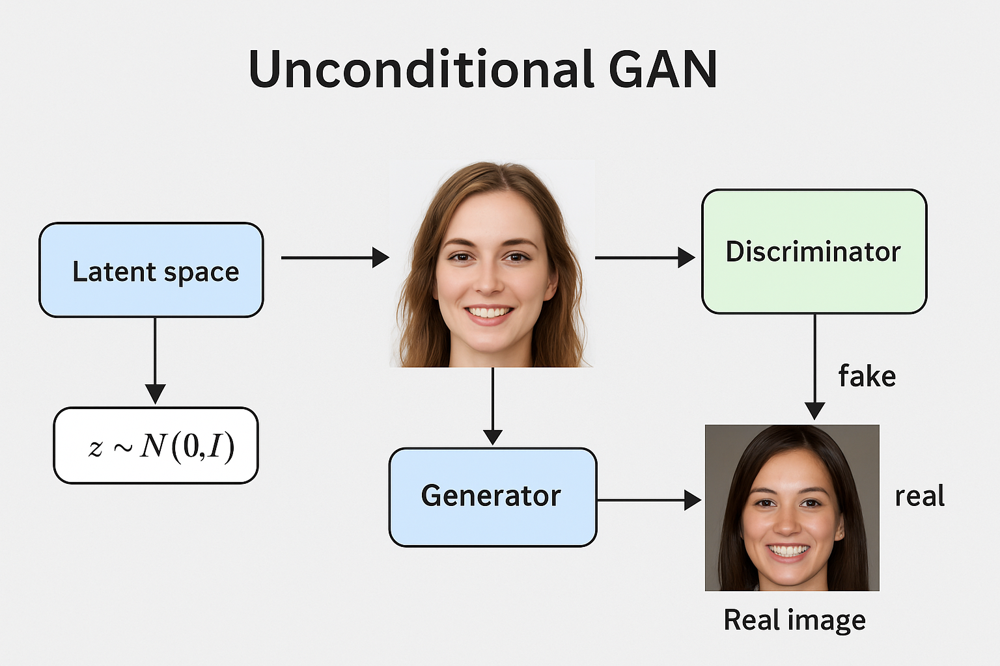

---

## ⚠️ 6. **Limitations of GANs**

* **Mode collapse**: G produces limited variety of images.
* **Training instability**: D and G must co-evolve.
* Often generates **sharp images** but **not diverse**.
* Doesn’t capture all image modes (poor manifold coverage).

---

## ⚠️ 1. **Mode Collapse**

### 🧠 What It Is:

* The **generator finds a small number of samples** that successfully fool the discriminator.
* It then keeps producing **very similar or identical outputs**, ignoring diversity.

### 🎯 Real Impact:

* If you give GAN a new latent vector $z$, it may still output **the same face or digits**.
* This means the model is **not covering the full image distribution** — only a **few "modes"** (subtypes of images).

### 🔬 Analogy:

Imagine a student who only learned 3 answers to a test and writes them no matter the question — that's mode collapse.

---

## ⚠️ 2. **Training Instability**

### 🔁 Why It Happens:

* GAN training is a **two-player minimax game**, not standard supervised learning.
* If **one player (usually the discriminator)** gets too strong or too weak:

  * Generator stops learning (no useful gradients)
  * Training collapses

### ⚠️ Problem Symptoms:

* Oscillating loss curves
* Generator forgets previously good outputs
* Sudden loss spikes

---

## ⚠️ 3. **No Likelihood Estimation**

* GANs don’t allow for **explicit evaluation** of how well the model captures the data distribution.
* Unlike VAEs or autoregressive models, **you can’t compute $p(x)$** for a sample.
* Makes **model comparison and debugging harder**.

---

## ⚠️ 4. **Evaluation Is Difficult**

GANs are **hard to evaluate quantitatively**. Common metrics include:

| Metric                           | Description                                                | Limitations                       |
| -------------------------------- | ---------------------------------------------------------- | --------------------------------- |
| Inception Score (IS)             | Measures how "classifiable" and "diverse" outputs are      | Fails on unlabelled datasets      |
| FID (Fréchet Inception Distance) | Measures distance between real and generated distributions | Sensitive to model initialization |
| Precision/Recall                 | Measures fidelity vs variety                               | Expensive to compute              |

But none perfectly reflect **perceived visual quality** or **manifold coverage**.

---

## ⚠️ 5. **Overfitting**

* GANs can **memorize** the training data if the dataset is too small or the model is too big.
* This means it generates samples very similar to training examples — **not truly "new" images**.

---

## ⚠️ 6. **Lack of Control (in Unconditional GANs)**

* You **can’t tell the generator what to produce**.
* It just spits out random but realistic images.
* Solved partially by **Conditional GANs** (Pix2Pix, CycleGAN) and **StyleGAN** (controls for age, gender, etc.).

---

## ⚠️ 7. **Data-Hungry**

* GANs require **large amounts of diverse training data**.
* In low-data regimes, they:

  * Overfit
  * Fail to generalize
  * Show artifacts or drop modes

---

## 🧠 Summary Table: GAN Weaknesses

| Limitation             | Description                                                      |
| ---------------------- | ---------------------------------------------------------------- |
| Mode Collapse          | Outputs lack diversity — collapse to a few common outputs        |
| Instability            | Adversarial training can diverge or oscillate                    |
| No explicit likelihood | Cannot assign a probability to samples — hard to measure success |
| Hard to evaluate       | IS, FID, and others are imperfect proxies                        |
| Overfitting            | Risk of memorizing training data                                 |
| Lack of control        | Can’t direct generation unless conditioned                       |
| Data requirements      | Need large and diverse datasets to work well                     |

---

## 🧪 Example Failures in Practice

* GAN outputs showing:

  * Repeated faces with minor variation
  * Blurry or corrupted features
  * Flickering video frames in video GANs
  * Inconsistent lighting or backgrounds

These are often due to one or more of the above limitations.

---

## 🧩 Why This Matters:

These limitations motivated the development of:

* **Improved GANs**: WGAN, StyleGAN, BigGAN
* **Alternative methods**: Diffusion models (e.g., DALL·E 2, Imagen), which offer:

  * Better diversity
  * Explicit likelihood estimation (some variants)
  * Easier conditioning

---



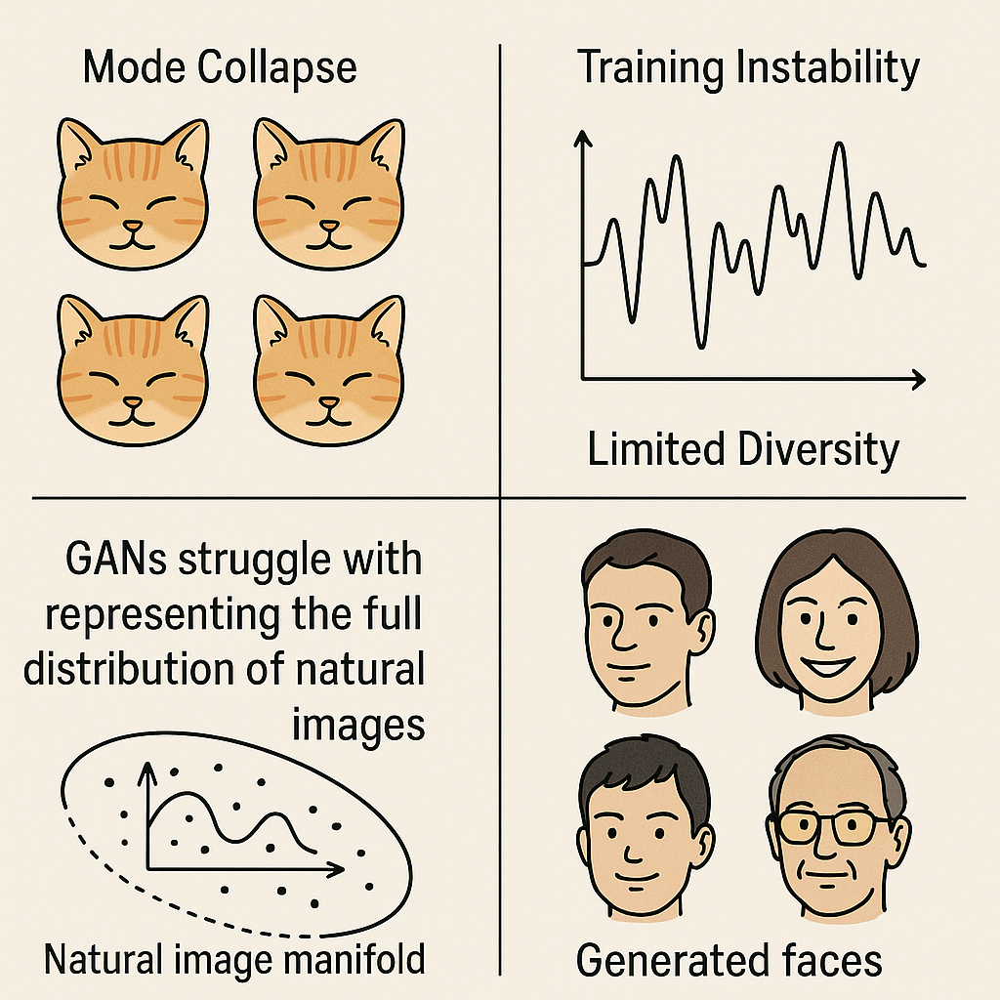

---

## 🧠 7. **Diffusion Models**

### 🔄 Key Idea:

* Start from **pure noise**, and **iteratively denoise** to produce a sample.
* **Learn the reverse of a gradual corruption process**.

### 🧠 Benefits:

* More **stable training** than GANs.
* Captures a **better manifold** → more diverse & realistic images.
* Can be **conditioned**: text, images, segmentation masks, etc.

### 💬 Notable Examples:

* **Denoising Diffusion Probabilistic Models (DDPM)**
* **DALL-E 2**: text → image
* **Palette**: image editing with iterative refinement


---

## 🌫️ What Are Diffusion Models?

**Diffusion models** generate data by **learning to reverse a noising process**.

### 🔁 Core Idea:

1. **Forward process**: Gradually add Gaussian noise to a real image over many steps until it becomes **pure noise**.
2. **Reverse process**: Train a neural network to **denoise** this step-by-step and recover the original image.

This process is called **denoising diffusion probabilistic modeling (DDPM)**.

---

## 🧪 Step-by-Step Breakdown

### 1. **Forward Diffusion Process** (Noising)

* Starting with a real image $x_0$, add noise step-by-step:

$$
x_1, x_2, \dots, x_T
$$

* At each step:

$$
x_t = \sqrt{1 - \beta_t} \cdot x_{t-1} + \sqrt{\beta_t} \cdot \epsilon
$$

Where:

* $\beta_t$: small positive constant (noise level)
* $\epsilon \sim \mathcal{N}(0, I)$: Gaussian noise

After many steps ($T \sim 1000$), you get pure noise:

$$
x_T \sim \mathcal{N}(0, I)
$$

### 2. **Reverse Denoising Process**

* A neural network $\epsilon_\theta(x_t, t)$ learns to predict the **noise** added at step $t$.
* Using this, it can gradually remove noise:

$$
x_{t-1} = \text{denoise}(x_t, t)
$$

* By doing this **in reverse from $T \to 0$**, you recover a clean image.

---

## 🎯 What the Model Learns

The neural network learns:

* **How images change over time when noise is added**
* **How to reverse this process to recover natural images**

The denoising network is usually a **U-Net** trained with a **variational loss function**.

---

## 💡 Why Is This Powerful?

| Advantage                 | Explanation                                                      |
| ------------------------- | ---------------------------------------------------------------- |
| ✅ **Stable Training**     | No adversarial game — no mode collapse or divergence             |
| ✅ **High Diversity**      | Covers the full image distribution (excellent manifold coverage) |
| ✅ **Controllable**        | Easily conditions on text, images, segmentation maps, etc.       |
| ✅ **High-Quality Images** | State-of-the-art samples for faces, art, medical imaging, etc.   |

---

## 📚 Famous Models

| Model                | Key Feature                                     |
| -------------------- | ----------------------------------------------- |
| **DDPM**             | Original diffusion model                        |
| **Improved DDPM**    | Faster sampling, better training objectives     |
| **DALL·E 2**         | Text-to-image generation using diffusion + CLIP |
| **Stable Diffusion** | Open-source text-to-image diffusion engine      |
| **Imagen**           | Google’s model with SOTA results                |
| **Palette**          | Image-to-image editing via diffusion            |

---

## 🧠 Comparison: GANs vs Diffusion

| Aspect       | GANs                            | Diffusion Models                                |
| ------------ | ------------------------------- | ----------------------------------------------- |
| Training     | Adversarial (unstable)          | Likelihood-based (stable)                       |
| Diversity    | May suffer from mode collapse   | Excellent, covers full data distribution        |
| Quality      | Very sharp images               | Very realistic, clean images                    |
| Speed        | Fast inference (\~1 step)       | Slow (\~50–1000 steps, but improving)           |
| Conditioning | Possible, but harder to control | Very flexible (text, image, pose, segmentation) |
| Evaluation   | No likelihood estimate          | Approximate log-likelihood possible             |

---

## 📌 Use Cases

* 🎨 **Text-to-Image** (e.g., “a dandelion shouting 'I made it!’”)
* 🧑‍🤝‍🧑 **Face generation**
* 🏞️ **Super-resolution**
* 🧱 **Inpainting**
* 🕺 **Pose-to-person generation**
* 📐 **Image editing**

---

## 🧠 Summary

| Concept              | Description                                            |
| -------------------- | ------------------------------------------------------ |
| Diffusion model      | Learns to reverse a noise process to generate new data |
| Forward process      | Adds Gaussian noise step-by-step                       |
| Reverse process      | Learns to denoise step-by-step                         |
| Network architecture | Usually U-Net with time embeddings                     |
| Output               | Very high-quality, diverse, realistic images           |
| Control              | Easy conditioning on text, labels, poses, etc.         |

---


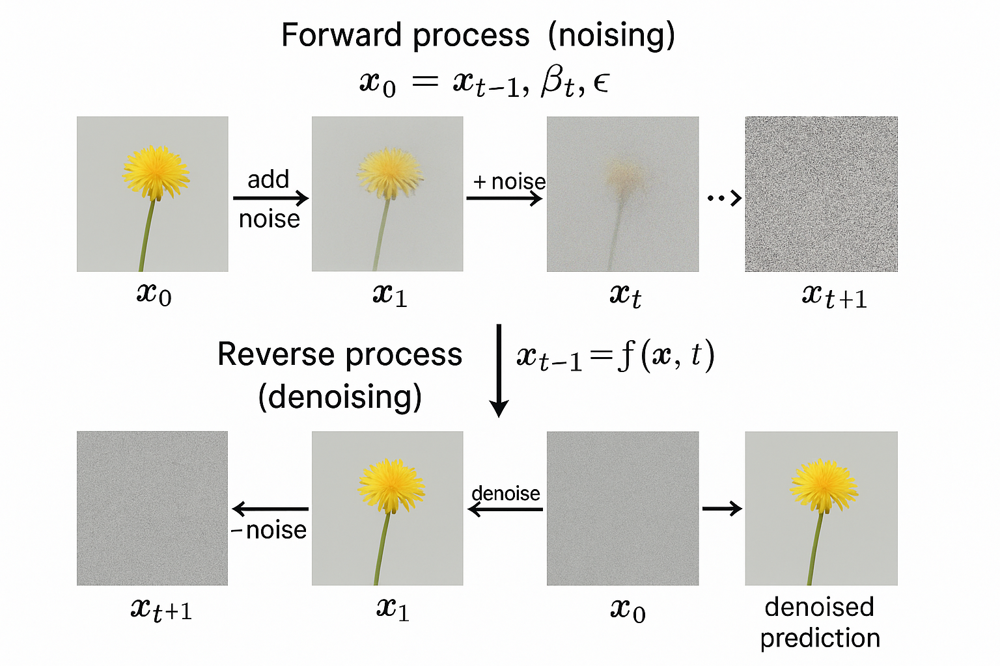

---

## 🧠 8. **Training with Captions & Prompts**

* Combine **images with captions** during training to align visual and textual representations.
* Enables **text-to-image generation** (e.g. “A dandelion shouting ‘I made it!’” → image).

---

## 🧠 Core Idea

Diffusion models can generate **images from text prompts** by being trained on **(image, caption)** pairs.

The model learns to **align visual and textual representations** so that:

* Given a text prompt, it can synthesize an image that **matches the semantics** of the prompt.

This is sometimes called **prompt conditioning** or **text conditioning**.

---

## 🔁 Training Process Overview

### Step 1: Collect Paired Data

* Datasets like **LAION**, **COCO Captions**, and **OpenAI’s curated data** contain:

  * Images + natural language descriptions (captions)

### Step 2: Text Encoding

* A **language encoder** converts captions into embeddings.
* Typically uses:

  * **Transformer-based models** (e.g., BERT, GPT)
  * **CLIP text encoder** (Contrastive Language–Image Pretraining)

### Step 3: Training the Diffusion Model

* The diffusion model is trained to **denoise images** conditioned on the **text embedding**.
* That is, at each denoising step, the model also receives the **text prompt** as input.

$$
\epsilon_\theta(x_t, t, c) \quad \text{where } c = \text{text embedding}
$$

---

## ✨ Example Prompt:

> "A dandelion shouting 'I made it!' in watercolor style"

* This is tokenized and encoded into a vector.
* The model uses this vector at each step during **denoising**, guiding the process toward an image that matches the prompt.

---

## 🔍 How Conditioning Works

1. **Concatenation**:

   * Add the text embedding to the latent input or intermediate feature maps.

2. **Cross-attention** (used in **Stable Diffusion**):

   * Inject textual features **into the U-Net layers** using attention layers.
   * Allows the model to focus on specific words (e.g., "red car", "sunset").

---

## 🧠 Architecture Example: DALL·E 2

1. **CLIP**: A dual encoder learns aligned **text and image embeddings**.
2. **Prior**: Predicts image embedding from text embedding.
3. **Decoder**: A diffusion model generates image from predicted image embedding.

---

## 🎨 Prompt Engineering

Since models like DALL·E 2 and Stable Diffusion **depend heavily on prompts**, users have learned to:

* Include styles: “in oil painting style”, “isometric pixel art”
* Add details: “high resolution”, “realistic lighting”
* Use composition hints: “in the center of the frame”, “on a sunny beach”

This is now an entire subfield: **prompt engineering**.

---

## 📚 Key Models Using Captions & Prompts

| Model                | Text Encoder    | Method                                    |
| -------------------- | --------------- | ----------------------------------------- |
| **DALL·E 2**         | CLIP            | Prior + Diffusion decoder                 |
| **Stable Diffusion** | CLIP (OpenCLIP) | Latent diffusion with cross-attention     |
| **Imagen**           | T5 (Google)     | Diffusion with powerful text conditioning |
| **Midjourney**       | CLIP-like       | Commercial diffusion-based model          |

---

## 🧪 Why This Works

Text and image embeddings **live in the same space**, allowing:

* Semantic alignment (cat ↔ 🐱 image)
* Rich conditioning
* Multi-modal learning (text ↔ image ↔ audio, etc.)

The model learns to **match visual features with textual concepts** — not just pixel similarity.

---

## 🧠 Summary

| Feature            | Description                                                       |
| ------------------ | ----------------------------------------------------------------- |
| Input              | Text prompt (natural language)                                    |
| Training Data      | Paired image-caption datasets                                     |
| Text Encoder       | Converts prompt to embedding                                      |
| Conditioning       | Embedding influences image generation at each denoising step      |
| Key Models         | DALL·E 2, Stable Diffusion, Imagen                                |
| Prompt Engineering | Crafting prompts to control output (style, content, layout, etc.) |

---


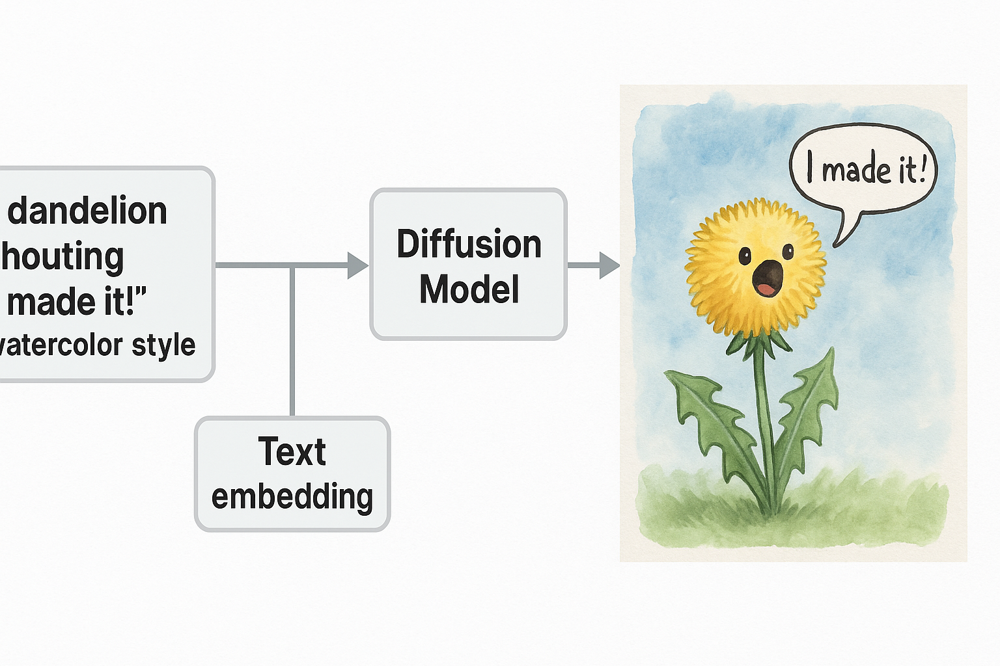

---

## 🧠 9. **Applications**

* Image generation
* Super-resolution
* Image editing
* Inpainting
* Style transfer
* Semantic image synthesis
* Text-to-image (e.g. DALL-E)
* Video synthesis (emerging)

---

## 🎨 1. **Text-to-Image Generation**

### 🔍 What It Does:

Given a natural language prompt, the model generates an image that matches the semantics of the text.

### 🧠 Used In:

* **DALL·E 2**
* **Stable Diffusion**
* **Midjourney**
* **Imagen (Google)**

### 💡 Example Prompts:

* “A medieval castle in cyberpunk style at night”
* “An astronaut riding a horse in a photorealistic desert”

---

## 🧍 2. **Image-to-Image Translation**

### 🔁 What It Does:

Takes an input image and modifies it while preserving structure or content.

### 🛠 Common Tasks:

* Sketch → Photo
* Semantic map → Realistic image
* Low-res → High-res (super-resolution)
* Incomplete image → Completed image (inpainting)
* Day → Night, summer → winter (style transfer)

---

## 🧼 3. **Image Inpainting**

### 🧠 What It Does:

Fills in **missing or masked regions** of an image in a realistic way.

This is more robust than GAN-based inpainting due to **manifold awareness**.

---

## 🔍 4. **Super-Resolution**

### 🔬 What It Does:

Enhances low-resolution images into **high-resolution, detailed versions**.

The model “imagines” what high-frequency details might look like, conditioned on the low-res input.

---

## 📏 5. **Image Editing via Prompts**

### 🖋 Example:

Prompt: “Make the sky sunset pink”
Input: Real photo
Output: Image edited to match prompt — no Photoshop required.

This is done by:

* Modifying latent representations
* Using **attention maps** to change only relevant parts of the image

---

## 📚 6. **Training-Free Classifier Guidance**

Even **without labeled datasets**, diffusion models can be guided to:

* Generate only a certain class (e.g., digits 0–9)
* Apply certain styles or modes

This is possible via **classifier-free guidance**, where conditioning can be modulated during inference.

---

## 🧠 7. **Other Domains Beyond Images**

Diffusion models are now being used in:

* **Audio generation** (e.g., music, speech)
* **3D object synthesis**
* **Medical imaging** (e.g., MRI reconstruction, anomaly detection)
* **Protein design**
* **Time-series imputation** and forecasting

---

## 📱 8. **Creative Tools & Industry Applications**

| Area                   | Example                                                   |
| ---------------------- | --------------------------------------------------------- |
| **Art & Illustration** | Midjourney, Adobe Firefly, Stable Diffusion art tools     |
| **Marketing**          | Generating custom assets, products, logos                 |
| **Game Development**   | Concept art, texture synthesis, environment generation    |
| **Film & Media**       | Storyboarding, background synthesis                       |
| **Fashion**            | Virtual clothing design, try-on synthesis                 |
| **Education**          | Visualizing concepts from text, like biology or astronomy |

---

## 🧠 Summary Table: Applications of Diffusion Models

| Application              | Description                                             |
| ------------------------ | ------------------------------------------------------- |
| Text-to-image generation | Create an image from a text prompt                      |
| Inpainting               | Fill missing or corrupted parts of an image             |
| Super-resolution         | Upscale low-res images                                  |
| Image editing            | Modify specific image regions based on user prompts     |
| Semantic translation     | Turn sketches or maps into realistic scenes             |
| Multimodal generation    | Apply to audio, 3D, and medical data                    |
| Creative tooling         | Artists and professionals use it for content generation |

---



---

## 🧠 10. **Comparison: GANs vs Diffusion**

| Aspect    | GANs                        | Diffusion Models                     |
| --------- | --------------------------- | ------------------------------------ |
| Training  | Unstable, adversarial       | Stable, gradual                      |
| Diversity | Often low (mode collapse)   | High diversity                       |
| Quality   | High (sharp images)         | Very high, photorealistic            |
| Speed     | Fast generation             | Slow (many steps)                    |
| Control   | Possible (conditional GANs) | Excellent (conditioning via prompts) |


---

## ⚔️ GANs vs Diffusion Models — Side-by-Side Breakdown

| Aspect                   | **GANs (Generative Adversarial Networks)**        | **Diffusion Models**                                |
| ------------------------ | ------------------------------------------------- | --------------------------------------------------- |
| **Core Principle**       | Adversarial learning (G vs D game)                | Denoising reverse process from noise                |
| **Training Stability**   | ❌ Unstable (risk of mode collapse, divergence)    | ✅ Very stable (likelihood-based objective)          |
| **Diversity of Outputs** | ❌ Can suffer from mode collapse (low diversity)   | ✅ High diversity (good manifold coverage)           |
| **Image Sharpness**      | ✅ Often very sharp and detailed images            | ✅ Very sharp (especially recent models like Imagen) |
| **Controllability**      | ✅ With conditional GANs (e.g. Pix2Pix, StyleGAN2) | ✅ Easy & flexible (text, pose, semantic maps, etc.) |
| **Sampling Time**        | ✅ Very fast (1 forward pass)                      | ❌ Slow (many denoising steps, 50–1000+)             |
| **Likelihood Modeling**  | ❌ No likelihood estimation                        | ✅ Approximate likelihood possible                   |
| **Evaluation**           | Hard (no explicit score)                          | Easier (can compute ELBO, NLL)                      |
| **Architecture**         | Generator + Discriminator                         | U-Net + scheduler + text/image encoder              |
| **Popular Variants**     | DCGAN, StyleGAN, BigGAN                           | DDPM, Stable Diffusion, DALL·E 2, Imagen            |

---

## 🧠 Conceptual Differences

### 🎲 GANs

* Train a **generator** to fool a **discriminator**.
* Goal: Real vs. Fake classification.
* Only **implicitly** learn the data distribution.
* Struggles with **diversity** and **training stability**.

### 🌫️ Diffusion Models

* Learn to **denoise** images in small steps.
* Based on **probabilistic modeling** (forward + reverse process).
* **Explicitly** model the data distribution (likelihood-based).
* Slower, but more **robust and diverse**.

---

## 🔬 Use-Case Preferences

| Task                          | Preferred Model Type   | Why?                                          |
| ----------------------------- | ---------------------- | --------------------------------------------- |
| Fast real-time generation     | **GANs**               | Single forward pass, low latency              |
| Maximum diversity & quality   | **Diffusion Models**   | More complete data coverage, no mode collapse |
| Text-to-image generation      | **Diffusion Models**   | Superior control with prompts                 |
| Face generation               | **GANs (StyleGAN2/3)** | Extremely sharp and editable                  |
| Small device deployment       | **GANs (lightweight)** | Can be optimized for mobile inference         |
| Scientific imaging / accuracy | **Diffusion**          | Likelihood-based, more robust to noise        |

---

## 🧩 Training Complexity

| Feature           | GANs                                 | Diffusion                             |
| ----------------- | ------------------------------------ | ------------------------------------- |
| Loss Function     | Min-max game (non-stationary target) | MSE loss (noise prediction), stable   |
| Training Duration | Shorter (fewer epochs)               | Longer (needs more steps and compute) |
| Convergence       | Unpredictable                        | Predictable, more reliable            |

---

## 🧠 Visual Metaphor

| GANs                                  | Diffusion Models                                            |
| ------------------------------------- | ----------------------------------------------------------- |
| Like a **counterfeiter vs. cop game** | Like a **gradual puzzle solving** — add noise, then undo it |
| Sharp, fast, but fragile              | Slow, deliberate, but diverse and robust                    |

---

## 📚 Summary Table

| GANs                                    | Diffusion Models                               |
| --------------------------------------- | ---------------------------------------------- |
| ⚔️ Adversarial setup (G vs. D)          | 🌫️ Noise reversal modeling                    |
| 🚀 Fast sampling                        | 🐢 Slow but improving                          |
| ❌ No likelihood                         | ✅ Approximate likelihood possible              |
| 🧨 Prone to instability & mode collapse | ✅ Robust & complete                            |
| 🎯 Conditional generation possible      | 🎯 Easy and precise conditioning               |
| 🎨 SOTA faces & styles (StyleGAN)       | 🖼️ SOTA diverse scenes & prompts (Imagen, SD) |

---

